<strong><b><font size="5">Time Series Characterisation</font></b></strong>
    Webster Gova



<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Time-Series" data-toc-modified-id="Time-Series-1"><span class="toc-item-num">
1&nbsp;&nbsp;</span>Time Series</a></span></li><li><span><a href="#Importing-Libraries-for-time-series-forecasting" data-toc-modified-id="Importing-Libraries-for-time-series-forecasting-3"><span class="toc-item-num">
2&nbsp;&nbsp;</span>Importing Libraries for time series forecasting</a></span></li><li><span><a href="#Importing-data" data-toc-modified-id="Importing-data-4"><span class="toc-item-num">
3&nbsp;&nbsp;</span>Importing data</a></span></li><li><span><a href="#Data-Preprocessing-and-Visualization" data-toc-modified-id="Data-Preprocessing-and-Visualization-5"><span class="toc-item-num">4&nbsp;&nbsp;</span>Data Preprocessing and Visualization</a></span><ul class="toc-item"><li><span><a href="#Stationarity" data-toc-modified-id="Stationarity-4.1"><span class="toc-item-num">
4.1&nbsp;&nbsp;</span>Stationarity</a></span><ul class="toc-item"><li><span><a href="#ACF-and-PACF-plots" data-toc-modified-id="ACF-and-PACF-plots-4.1.1"><span class="toc-item-num">4.1.1&nbsp;&nbsp;</span>ACF and PACF plots</a></span></li><li><span><a href="#Plotting-Rolling-Statistics" data-toc-modified-id="Plotting-Rolling-Statistics-4.1.2"><span class="toc-item-num">4.1.2&nbsp;&nbsp;</span>Plotting Rolling Statistics</a></span></li><li><span><a href="#Augmented-Dickey-Fuller-Test" data-toc-modified-id="Augmented-Dickey-Fuller-Test-4.1.3"><span class="toc-item-num">4.1.3&nbsp;&nbsp;</span>Augmented Dickey-Fuller Test</a></span></li></ul></li><li><span><a href="#Making-Time-Series-Stationary" data-toc-modified-id="Making-Time-Series-Stationary-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Making Time Series Stationary</a></span><ul class="toc-item"><li><span><a href="#Transformations" data-toc-modified-id="Transformations-4.2.1"><span class="toc-item-num">4.2.1&nbsp;&nbsp;</span>Transformations</a></span><ul class="toc-item"><li><span><a href="#Log-Scale-Transformation" data-toc-modified-id="Log-Scale-Transformation-4.2.1.1"><span class="toc-item-num">4.2.1.1&nbsp;&nbsp;</span>Log Scale Transformation</a></span></li><li><span><a href="#Other-possible-transformations:" data-toc-modified-id="Other-possible-transformations:-4.2.1.2"><span class="toc-item-num">4.2.1.2&nbsp;&nbsp;</span>Other possible transformations:</a></span></li></ul></li><li><span><a href="#Techniques-to-remove-Trend---Smoothing" data-toc-modified-id="Techniques-to-remove-Trend---Smoothing-5.2.2"><span class="toc-item-num">4.2.2&nbsp;&nbsp;</span>Techniques to remove Trend - Smoothing</a></span><ul class="toc-item"><li><span><a href="#Moving-Average" data-toc-modified-id="Moving-Average-4.2.2.1"><span class="toc-item-num">4.2.2.1&nbsp;&nbsp;</span>Moving Average</a></span></li><li><span><a href="#Exponentially-weighted-moving-average:" data-toc-modified-id="Exponentially-weighted-moving-average:-4.2.2.2"><span class="toc-item-num">4.2.2.2&nbsp;&nbsp;</span>Exponentially weighted moving average:</a></span></li></ul></li><li><span><a href="#Further-Techniques-to-remove-Seasonality-and-Trend" data-toc-modified-id="Further-Techniques-to-remove-Seasonality-and-Trend-4.2.3"><span class="toc-item-num">4.2.3&nbsp;&nbsp;</span>Further Techniques to remove Seasonality and Trend</a></span><ul class="toc-item"><li><span><a href="#Differencing" data-toc-modified-id="Differencing-4.2.3.1"><span class="toc-item-num">4.2.3.1&nbsp;&nbsp;</span>Differencing</a></span></li><li><span><a href="#Decomposition" data-toc-modified-id="Decomposition-4.2.3.2"><span class="toc-item-num">4.2.3.2&nbsp;&nbsp;</span>Decomposition</a>

# Time Series
- A time series is a sequential set of data points, measured typically over successive times. 
- It is mathematically defined as a set of vectors x(t), t = 0,1,2,... where t represents the time elapsed. 
- The variable x(t) is treated as a random variable. 
- The measurements taken during an event in a time series are arranged in a proper chronological order. 
- A time series containing records of a single variable is termed as univariate, and more than one variable a multivariate. 

# Importing Libraries for time series forecasting

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima_model import ARMA, ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

from math import sqrt

import matplotlib
import matplotlib.pyplot as plt
matplotlib.colors
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'
import seaborn as sns

from random import random

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, mean_squared_log_error

import warnings; import os
warnings.filterwarnings("ignore")
plt.style.available
plt.style.use('bmh')

# Importing data
- Dataset: Trade data:
    - location_id: /- product_id: SITC 4 digit code system
    - year: from 1963 to 2017  - export_value: / - import_value: - / - export_rca:
    - is_new: / - cog: / - distance: / - normalized_distance: / - normalized_cog:
    - normalized_pci: /- export_rpop: / - sitc_eci: / - sitc_coi: / - pci: /- location_code: /- location_name_short_en:
    - sitc_product_code: / - sitc_product_name_short_en: /- Unit: arbitrary

In [2]:
product = 'engine_parts'

def load_data(csv_name,trade_form,target_value, code_system,sitc_code,ts_type):
    '''
    Ingests a SITC multi-time series trade data in csv format, filters for one product code, and renames target columns
    & creates dataframe of target columns
    Parameters:
    -----------
    csv:
    trade_form:
    target_value:
    code_system:
    sitc_code:
    ts_type:
    '''
    data = pd.read_csv(csv_name)#,header=None
    dframe = data.loc[data[code_system]==sitc_code]
    dframe.rename(columns={'location_name_short_en': 'exporter','export_rca': 'rca'}, inplace=True)
    dframe = dframe[[ts_type,trade_form,target_value]]
    dframe = dframe[dframe[trade_form] != 'Undeclared Countries']
    dframe[target_value].replace('',0, inplace=True)
    dframe = dframe[dframe[target_value] != 0]
    #dframe = dframe[dframe[target_value] >= 0.01]
    return dframe

In [3]:
xdf = load_data('sitc4digit_year.csv','exporter','rca','sitc_product_code',7132,'year')
xdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8012 entries, 6133560 to 6145071
Data columns (total 3 columns):
year        8012 non-null int64
exporter    8012 non-null object
rca         8012 non-null float64
dtypes: float64(1), int64(1), object(1)
memory usage: 250.4+ KB


In [4]:
print('Shape of the dataframe: {}'.format(xdf.shape)) # Full dataset is 8012 entries
print('Data ranges from {} to {}'.format(xdf.year.min(),xdf.year.max()))
print('The rca values range from {} to {}'.format(xdf.rca.min(),xdf.rca.max()))
print('Countries not declared are {} out of {}'.format(xdf['exporter'].loc[xdf['exporter']=='Undeclared Countries'].count(),xdf.exporter.count()))
print('Zero export values: {}'.format(xdf['rca'][xdf['rca']==0].count()))
print('Null export values: {}'.format(xdf['rca'].isnull().sum()))

Shape of the dataframe: (8012, 3)
Data ranges from 1962 to 2017
The rca values range from 1.0099244e-06 to 114.69768
Countries not declared are 0 out of 8012
Zero export values: 0
Null export values: 0


# Data Preprocessing and Visualization

__Converting to datetime format:__

In [5]:
xdf['year'] = pd.to_datetime(xdf['year'], format='%Y')
xdf.columns

Index(['year', 'exporter', 'rca'], dtype='object')

In [6]:
#xdf = xdf.drop(columns=["rca"])
#xdf.columns

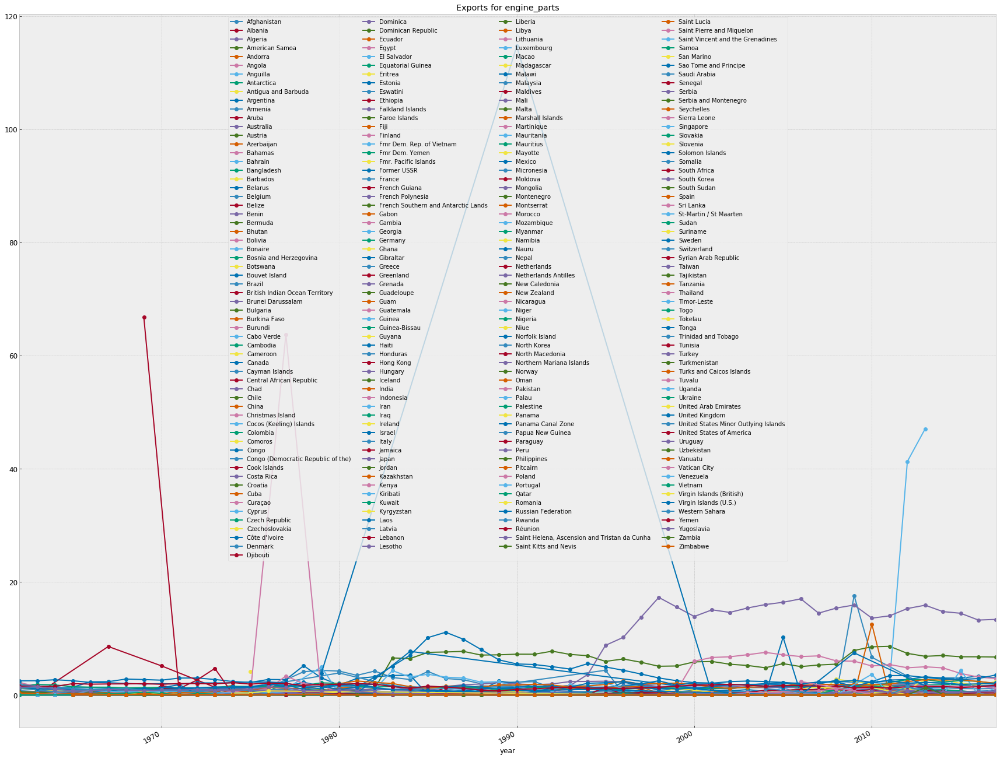

In [7]:
fig, ax = plt.subplots(figsize=(30,25))
for key, grp in xdf.groupby(['exporter']):
        ax = grp.plot(ax=ax, kind='line', x='year', y='rca', label=key, marker='o',title='Exports for {}'.format(product))
        ax.legend(ncol=4, loc='best')

#target = 'images\\engine_parts\\images\\rca_tests'
#savefile = os.path.join(os.getcwd(),target,str(label))
#plt.savefig(savefile)
#xdf.groupby('exporter').plot(x='year', y='export_value',title=xdf.exporter.)


In [8]:
ax.title

Text(0.5, 1.0, 'Exports for engine_parts')

In [9]:
df_grp = xdf.set_index('year')
df_grp.head(2)

,exporter,rca
year,,
1996-01-01,Aruba,0.001547
1997-01-01,Aruba,0.000324


In [10]:
#df_grps = df_grp.groupby('exporter').mean().unstack()
df_grps = xdf.groupby([xdf.year.name, xdf.exporter.name]).mean().unstack()
#xport_grps.plot()
df_grps.head(2)

rca                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  
exporter   Afghanistan   Albania   Algeria American Samoa Andorra    Angola Anguilla Antarctica Antigua and Barbuda Argentina Armenia Aruba Australia   Austria Azerbaijan   Bahamas   Bahrain Bangladesh Barbados Belarus   Belgium Belize     Benin   Bermuda Bhutan   Bolivia Bonaire Bosnia and Herzegovina Botswana Bouvet Island    Brazil British Indian Ocean Territory Brunei Darussalam  Bulgaria Burkina Faso   Burundi Cabo Verde  Cambodia  Cameroon    Canada Cayman Islands Central African Republic      Chad     Chile     China Christmas Island Cocos (Keeling) Islands  Colombia Comoros     Congo Congo (Democratic Republic of the) Cook Islands Costa Rica Croatia      Cuba Curaçao    Cyprus Czech Republic Czechoslovakia Côte d'Ivoire   Denmark  Djibouti Dominica Dominican Republic   Ecuador     Egypt El Salvador Equatorial Guinea Eritrea Estonia Eswatini  Ethiopia Falkland Islands Faroe Islands      Fiji   Finland Fmr Dem. Rep. of Vietnam Fmr Dem. Yemen Fmr. Pacific Islands Former USSR    France French Guiana French Polynesia French Souther

In [11]:
df_grps = df_grps.dropna(axis='columns')

In [12]:
df_grps.columns = df_grps.columns.droplevel()
#df_grps = df_grps.droplevel('year')#,axis=1)
df_grps.head(3)

exporter,Argentina,Australia,Austria,Belgium,Brazil,Bulgaria,Canada,Chile,China,Cyprus,Denmark,Finland,France,Germany,Greece,Hong Kong,Hungary,India,Indonesia,Ireland,Israel,Italy,Japan,Kenya,Malta,Mexico,Morocco,Netherlands,New Zealand,Nigeria,Norway,Oman,Panama,Poland,Portugal,Romania,Saudi Arabia,Singapore,South Africa,South Korea,Spain,Sweden,Switzerland,Taiwan,Thailand,Trinidad and Tobago,Tunisia,Turkey,United Kingdom,United States of America,Venezuela
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1962-01-01,0.007866,0.018789,0.580496,0.473824,0.001091,0.021476,0.230185,0.017811,0.004118,0.043419,1.848899,0.047126,0.820721,1.674000,0.043051,0.148012,0.502856,0.141510,0.000214,0.108328,0.067291,1.321232,0.569255,0.014842,0.456691,0.012943,0.003992,0.491603,0.002795,0.059694,0.554667,0.107453,0.120572,0.082400,0.072541,0.011424,0.001992,0.265236,0.024796,0.157027,0.350309,1.234533,1.777193,0.100061,0.009710,0.004553,0.027125,0.002076,2.501614,1.556420,0.005862
1963-01-01,0.030374,0.158385,0.567719,0.439567,0.005507,0.096400,0.515274,0.001617,0.001561,0.090395,1.581009,0.136433,0.992000,1.856449,0.035953,0.168285,0.300612,0.137130,0.000186,0.031978,0.051800,1.280610,0.538054,0.017444,0.420222,0.014064,0.016132,0.476203,0.013622,0.031367,0.468919,0.167411,0.129274,0.079050,0.101756,0.007961,0.000465,0.245206,0.017212,0.262759,0.235374,1.117450,1.586234,0.051746,0.010814,0.003366,0.019180,0.002537,2.519554,1.511864,0.000510
1964-01-01,0.016790,0.173532,0.613761,0.458269,0.018279,0.109635,1.282494,0.015909,0.004871,0.194742,1.237742,0.096689,0.922372,1.775067,0.040048,0.118344,0.287945,0.157611,0.007764,0.042559,0.050899,1.093685,0.554424,0.036107,0.271898,0.008993,0.047723,0.434068,0.026375,0.024659,0.443444,0.041108,0.068640,0.284105,0.274675,0.002642,0.001106,0.114891,0.015752,0.077404,0.136077,1.024864,1.506083,0.102161,0.027578,0.004700,0.048897,0.013815,2.688499,1.513119,0.000502


In [13]:
#df_grps['exporter']
#df_grps = df_grps['export_value']
#eng_parts_xporters = df_grps.columns

__Setting index as the datetime column for easier manipulations:__

In [14]:
#df_pivoted = xdf.pivot_table(index='year',columns='exporter',values='export_value',aggfunc='sum')
#df_pivoted.plot(legend=True)#,subplots=True)#, legend=False)


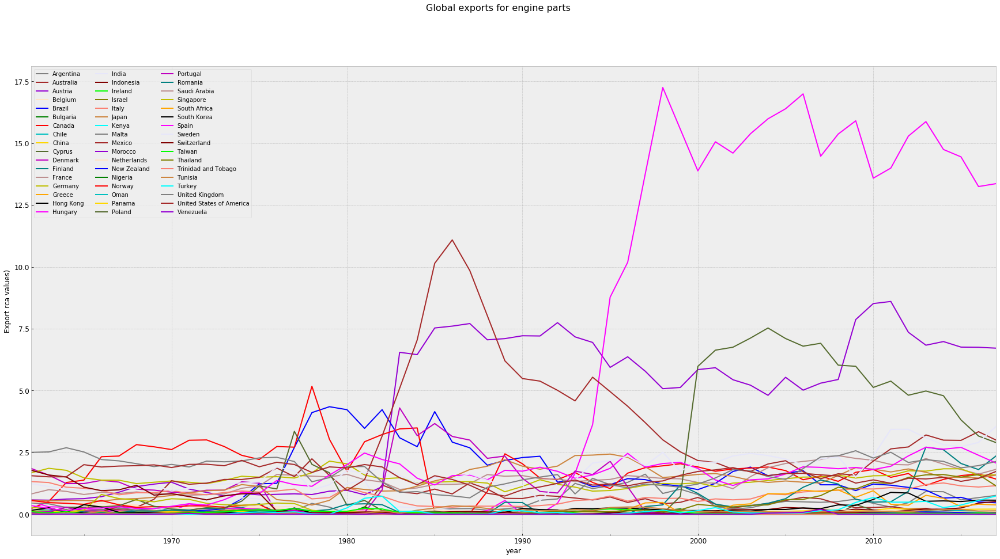

In [15]:
#df_pivoted = xdf.pivot_table(index='year',columns='exporter',values='export_value',aggfunc='sum')
fig1, ax1 = plt.subplots(figsize=(30,15))
#https://matplotlib.org/3.1.0/gallery/color/named_colors.html
colors = ["gray","brown","darkviolet","bisque","b","g","r","c","gold","darkolivegreen","m","teal","rosybrown","y","orange","k","fuchsia","lavender","maroon","lime",
          "olive","salmon","peru","aqua"]
label='global trends in export rca values for engine parts'
df_grps.plot(ax=ax1,label=label,color=colors)
ax1.set_ylabel('Export rca values)')
fig1.suptitle("Global exports for engine parts", fontsize=16)

plt.legend(ncol=3,loc='best')

location = os.getcwd()
target = 'images\\engine_parts\\rca_tests'
path = os.path.join(location, target)
savefile = os.path.join(path, 'export rca trends')
plt.savefig(str(savefile))
#.plot(legend=False)#subplots=True, legend=False)

In [16]:
# Adapted from https://stackoverflow.com/questions/30942755/plotting-multiple-time-series-after-a-groupby-in-pandas
# Modified from https://www.programcreek.com/python/example/98021/matplotlib.dates.YearLocator
from matplotlib.dates import YearLocator, MonthLocator, DateFormatter

def plot_multiple_time_series(dframe, ts_label, grp_label, values_label, product,figsize=(30,15), title=None):
    '''
    Plots multiple time series on one chart by first grouping time series based on series names from column in dataframe

    Parameters:
    ----------
    dframe : timeseries Pandas dataframe
    ts_label : string
        The name of the df column that has the datetime timestamp x-axis values.
    grp_label : string
        The column name in dframe for groupby method.
    values_label : string
        The column name in dframe for the y-axis.
    figsize : tuple of two integers
        Figure size of the resulting plot, e.g. (20, 7)
    title : string
        Optional title
    '''
    xtick_locator = YearLocator()
    xtick_dateformatter = DateFormatter('%Y')
    fig, ax = plt.subplots(figsize=figsize)
    location = os.getcwd()
    target = 'images\\engine_parts\\rca_tests'
    path = os.path.join(location, target)
    for key, grp in dframe.groupby([grp_label]):
        ax = grp.plot(ax=ax, kind='line', x=ts_label, y=values_label, label=key, marker='o')
    ax.xaxis.set_major_locator(xtick_locator)
    ax.xaxis.set_major_formatter(xtick_dateformatter)
    ax.autoscale_view()
    ax.legend(ncol=5, loc='upper left')
    #_ = plt.xticks(rotation=0, )
    _ = plt.grid()
    _ = plt.xlabel('year')
    _ = plt.ylabel('Export rca value')
    _ = plt.ylim(0, dframe[values_label].max() * 1.25)
    if title is not None:
        _ = plt.title(title)
    savefile = os.path.join(path,label)
    plt.savefig(str(savefile))
    _ = plt.show()

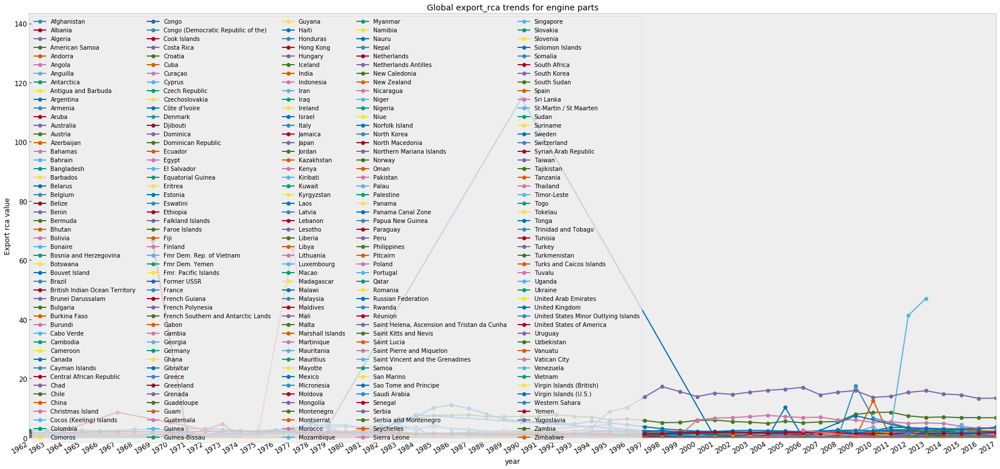

In [17]:
plot_multiple_time_series(xdf, 'year', 'exporter', 'rca', 'engine_parts',title='Global export_rca trends for engine parts')

__Reviewing plots of the density of observations can provide further insight into the structure of the data:__
- The distribution is not perfectly Gaussian (normal distribution).
- The distribution is left shifted.
- Transformations might be useful prior to modelling.

In [18]:
#y = df_grps.set_index('year')
#y.index

<Figure size 2160x1080 with 0 Axes>

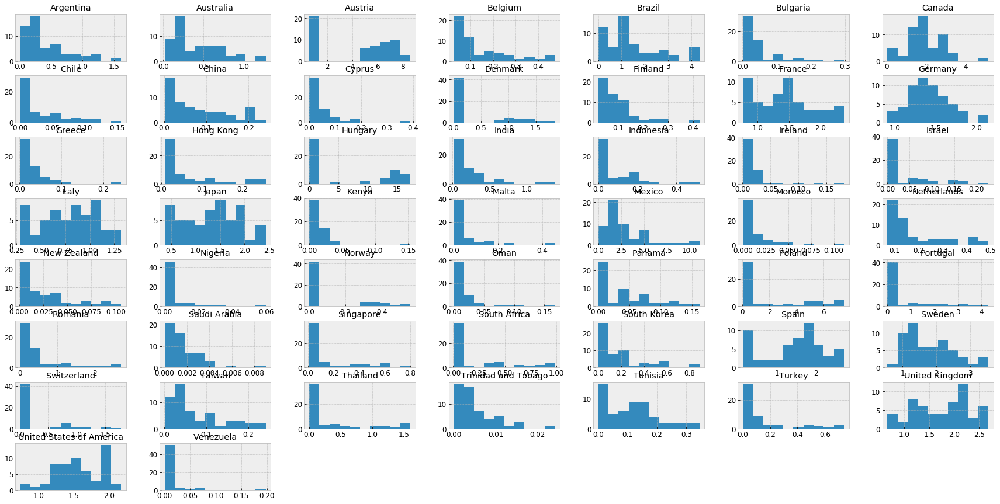

In [19]:
from pandas import Series
from matplotlib import pyplot

pyplot.figure(1,figsize=(30,15))
#pyplot.subplot(211)
df_grps.hist(figsize=(30,15))
#pyplot.subplot(212)
#df_grps.plot(kind='line',figsize=(30,15))
savefile = os.path.join(path, 'rca histograms')
pyplot.savefig(savefile)
pyplot.show()

#y.passengers.hist()
#y.passengers.plot(kind='kde')


__Box and Whisker Plots:__
- Median values across years confirms an upwards trend
- Steady increase in the spread, or middle 50% of the data (boxes) over time
- A model considering seasonality might work well

In [20]:
y = xdf.set_index('year')

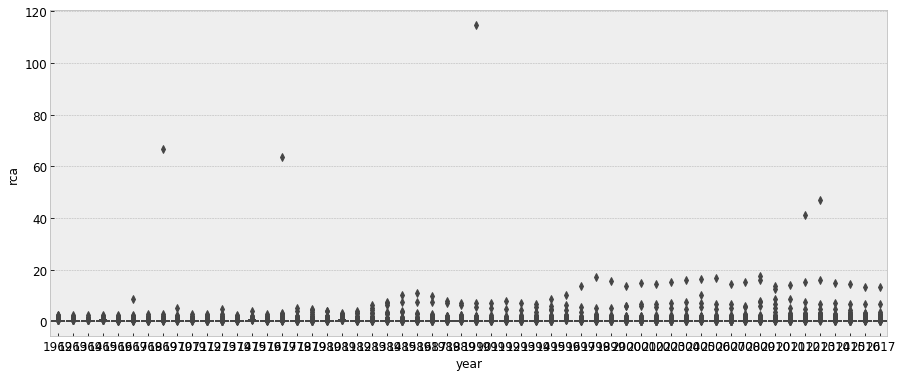

In [21]:
fig, ax = plt.subplots(figsize=(15,6))
sns.boxplot(y.rca.index.year,y.rca,ax=ax)
#sns.boxplot(y.export_value.index.year, y.export_value, ax=ax)

__Decomposing using statsmodel:__
- We can use statsmodels to perform a decomposition of this time series. 
- The decomposition of time series is a statistical task that deconstructs a time series into several components, each representing one of the underlying categories of patterns. 
- With statsmodels we will be able to see the trend, seasonal, and residual components of our data.

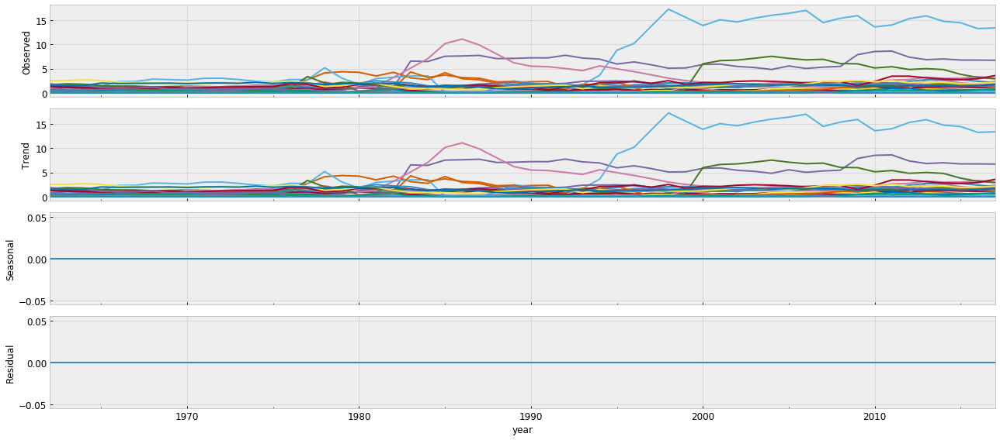

In [24]:
from pylab import rcParams
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(df_grps, model='additive')
fig = decomposition.plot()
#plt.title('Decomposition of export time series')
savefile = os.path.join(path, 'Decompose')
plt.savefig(savefile)
plt.show()

## Stationarity
- Most of the Time Series models work on the assumption that the TS is stationary. 
- Major reason for this is that there are many ways in which a series can be non-stationary, but only one way for stationarity.
- Intuitively, we can say that if a Time Series has a particular behaviour over time, there is a very high probability that it will follow the same in the future. 
- Also, the theories related to stationary series are more mature and easier to implement as compared to non-stationary series.

__Notes from__ [Alkaline ML]</https://www.alkaline-ml.com/pmdarima/tips_and_tricks.html/>

- tests of stationarity for testing a null hypothesis that an observable univariate time series is stationary around a deterministic trend (i.e. trend-stationary).
- A time series is __stationary when its mean, variance and auto-correlation, etc., are constant over time__. 
- Many time-series methods may perform better when a time-series is stationary, since forecasting values becomes a far easier task for a stationary time series (high probability of behaving the same way)
- ARIMAs that include differencing (i.e., d > 0) assume that the data becomes stationary after differencing. 
- This is called __difference-stationary__
- Auto-correlation plots are an easy way to determine whether your time series is sufficiently stationary for modeling. 
- If the plot does not appear relatively stationary, your model will likely need a differencing term. 
- These can be determined by using an Augmented Dickey-Fuller test, or various other statistical testing methods. 
- Note that auto_arima will automatically determine the appropriate differencing term for you by default.

In order to quantitatively determine whether we need to difference our data in order to make it stationary, we can conduct a test of stationarity

__We can check stationarity using the following:__

1. __ACF and PACF plots__:
    - If the time series is stationary, the ACF/PACF plots will show a __quick drop-off in correlation__ after a small amount of lag between points.
2. __Plotting Rolling Statistics__: 
    - We can plot the moving average or moving variance and see if it varies with time. 
    - __Moving average/variance__ is for any instant ‘t’, the average/variance of the last period (e.g year or last 12 months)
3. __Augmented Dickey-Fuller Test:__
    - This is one of the statistical tests for checking stationarity.
    - Here the __null hypothesis is that the TS is non-stationary__. 
    - The test results comprise of a Test Statistic and some Critical Values for difference confidence levels. 
    - If the ‘Test Statistic’ is less than the ‘Critical Value’, we can reject the null hypothesis and say that the series is stationary. Refer this article for details.

### ACF and PACF plots

- Let's review the Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) plots
- If the time series is stationary, the ACF/PACF plots will show a __quick drop-off in correlation__ after a small amount of lag between points.
- This data is non-stationary as a high number of previous observations are correlated with future values.
- Confidence intervals are drawn as a cone. 
- By default, this is set to a 95% confidence interval, suggesting that correlation values outside of this code are very likely a correlation and not a statistical fluke.
- The partial autocorrelation at lag k is the correlation that results after removing the effect of any correlations due to the terms at shorter lags.

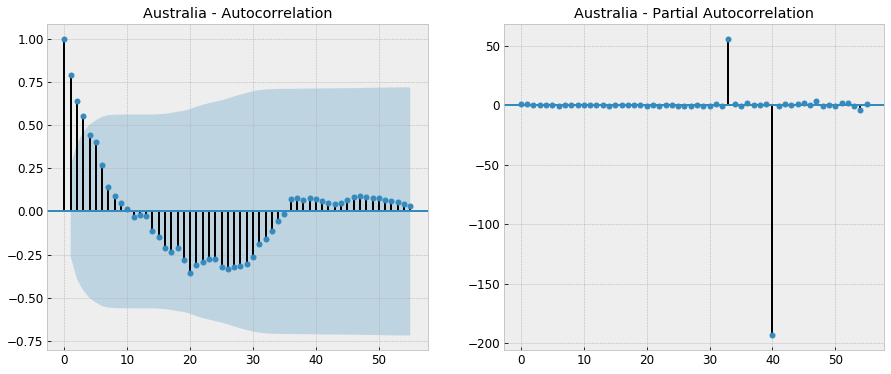

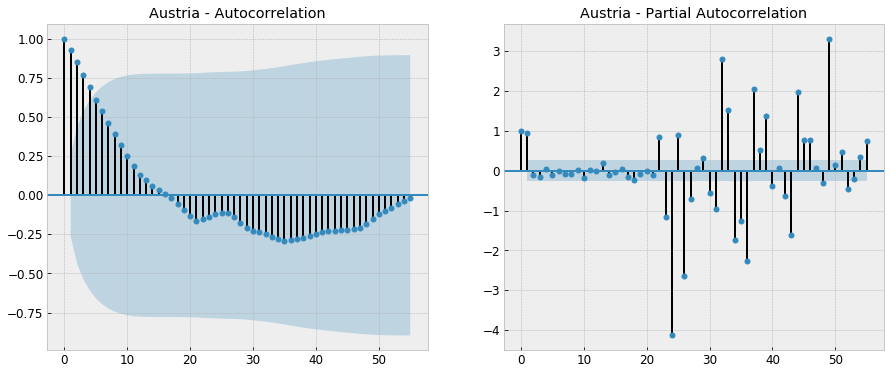

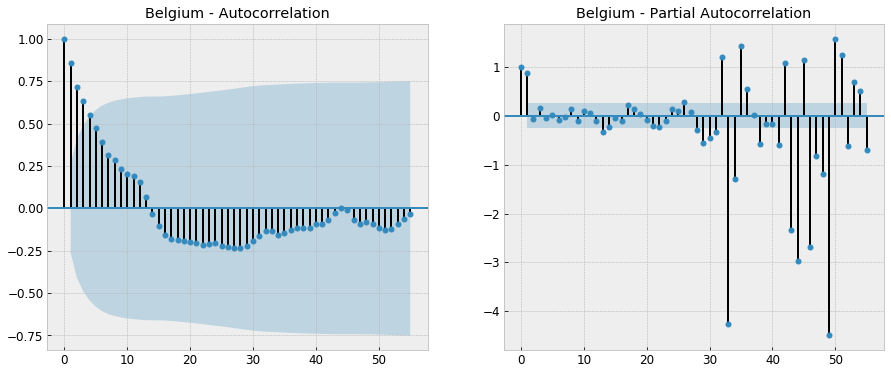

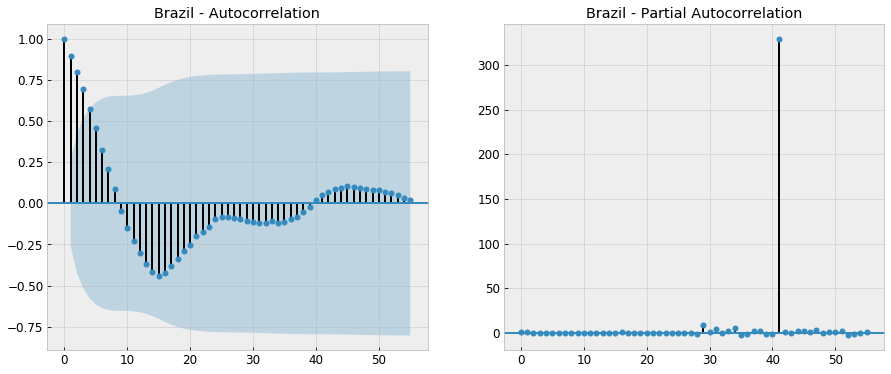

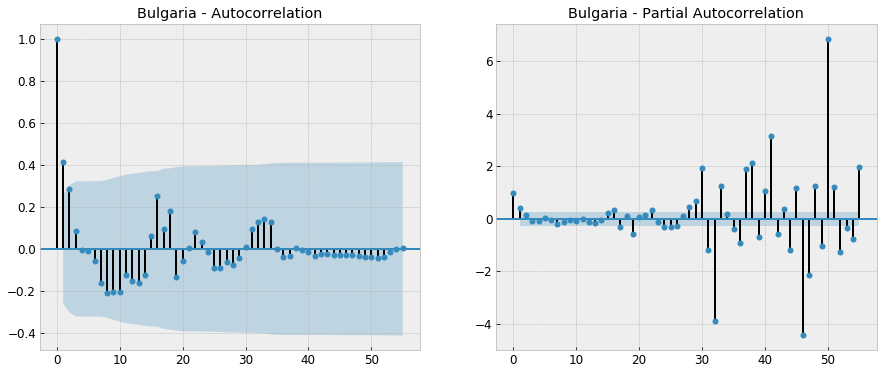

...

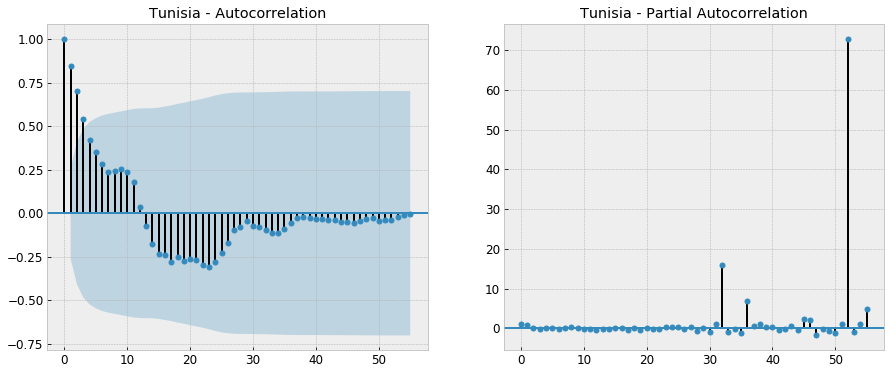

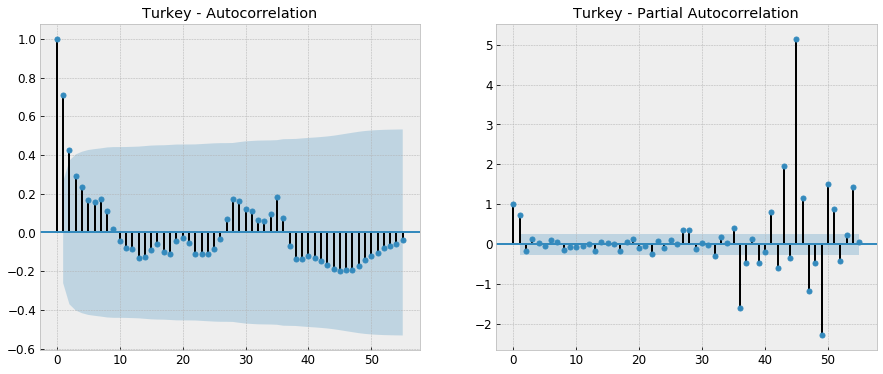

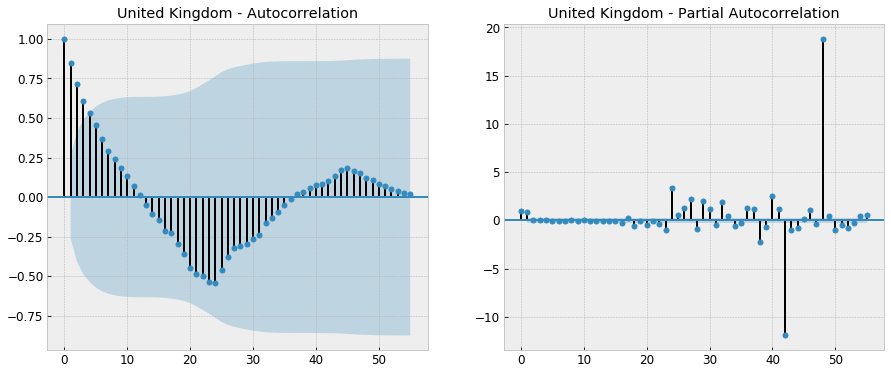

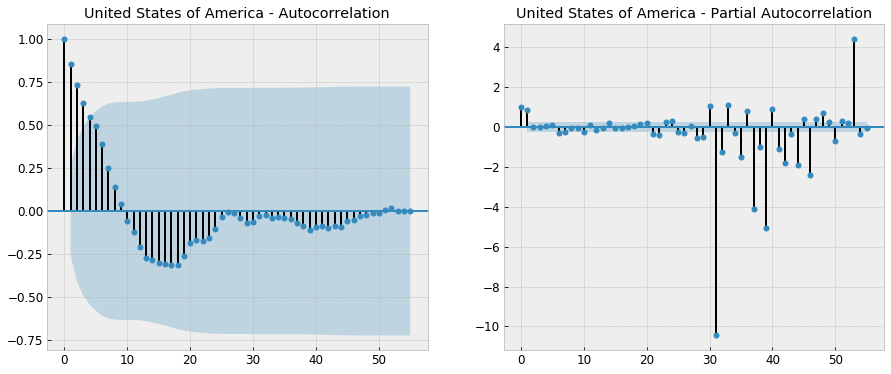

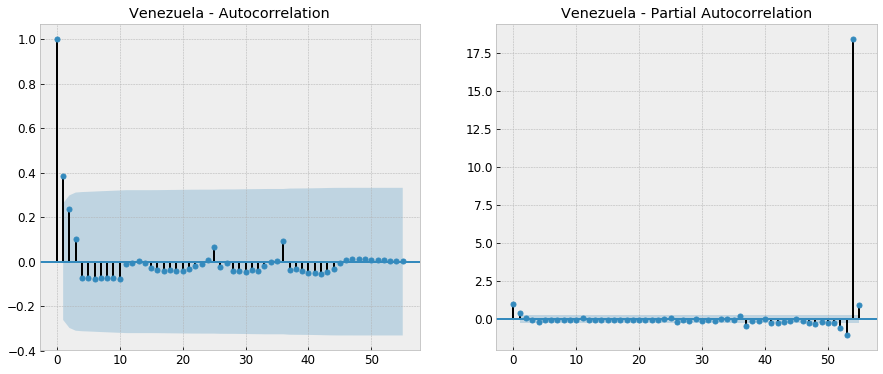

In [25]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import os

columns = df_grps.columns
y = df_grps.columns[1:]
cycles = int((len(df_grps))/5)
path = os.getcwd()+'\\images\\engine_parts\\rca_tests\\acf_pacf\\'
for col in y:
    pyplot.figure(figsize=(15,6))
    pyplot.subplot(121)
    plot_acf(df_grps[col], ax=pyplot.gca(),title="{} - Autocorrelation".format(df_grps[col].name))
    pyplot.subplot(122)
    plot_pacf(df_grps[col], ax=pyplot.gca(),title="{} - Partial Autocorrelation".format(df_grps[col].name))
    savefile = os.path.join(path, df_grps[col].name)
    pyplot.savefig(str('{}_ACF_PACF'.format(savefile)))
    pyplot.show()

### Plotting Rolling Statistics
- We observe that the rolling mean and Standard deviation are not constant with respect to time (increasing trend)
- The time series is hence not stationary

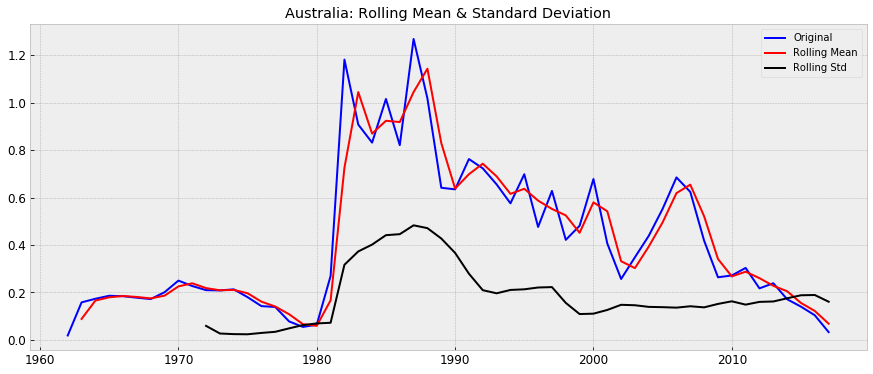

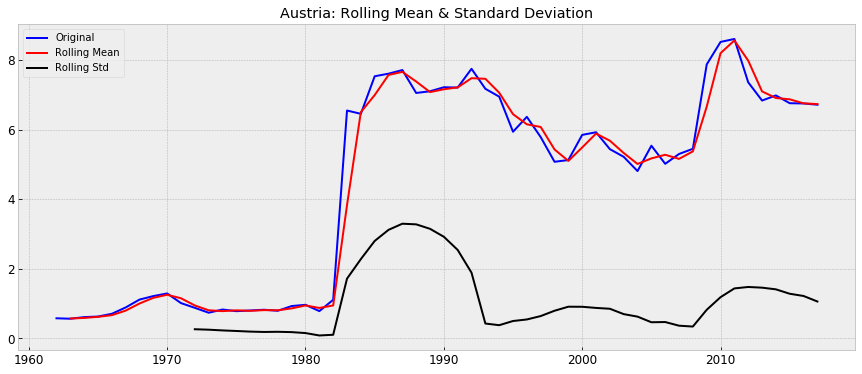

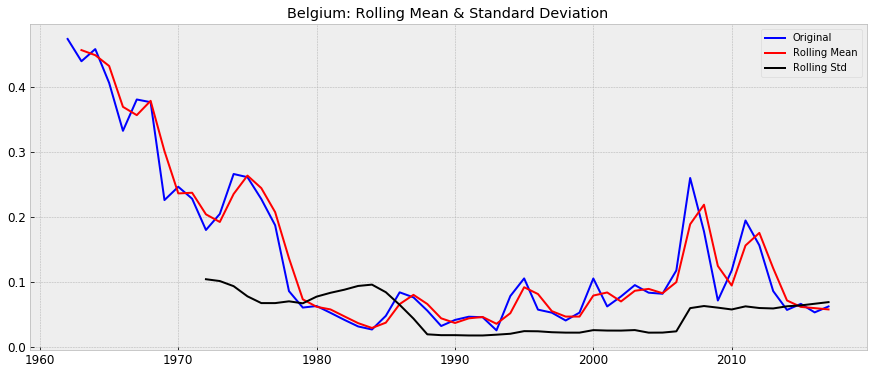

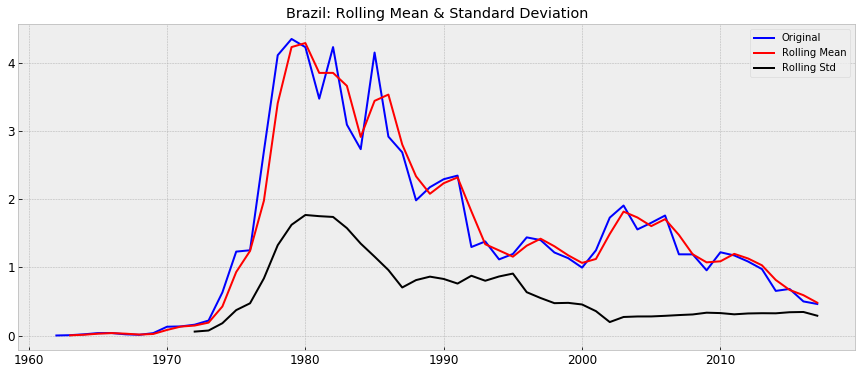

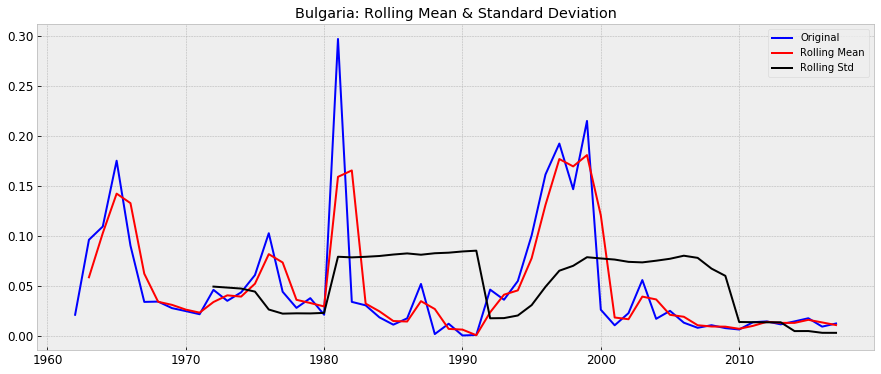

...

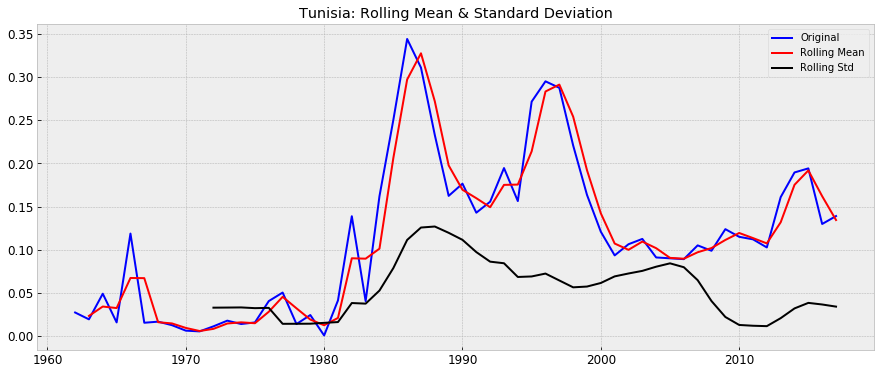

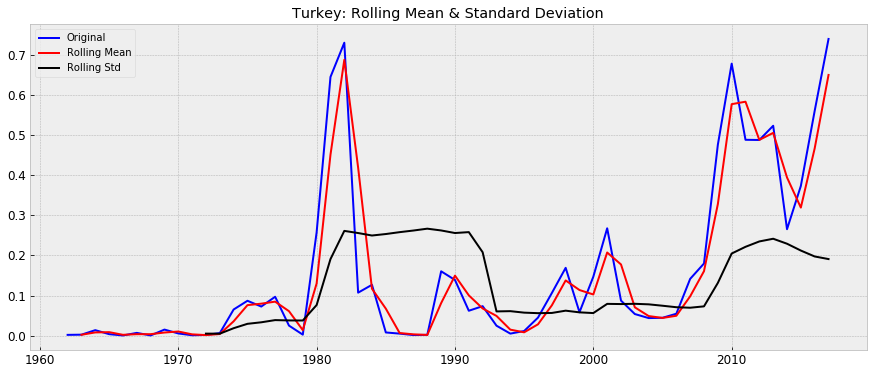

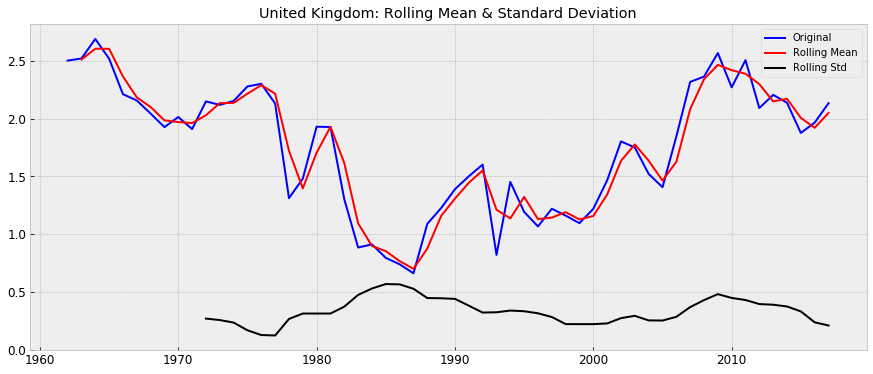

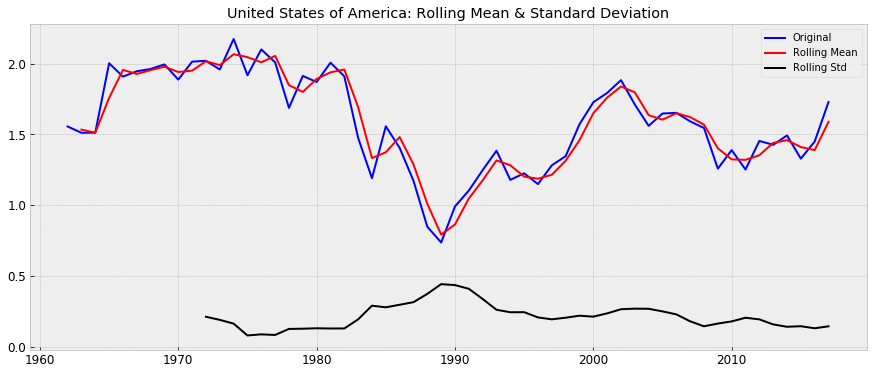

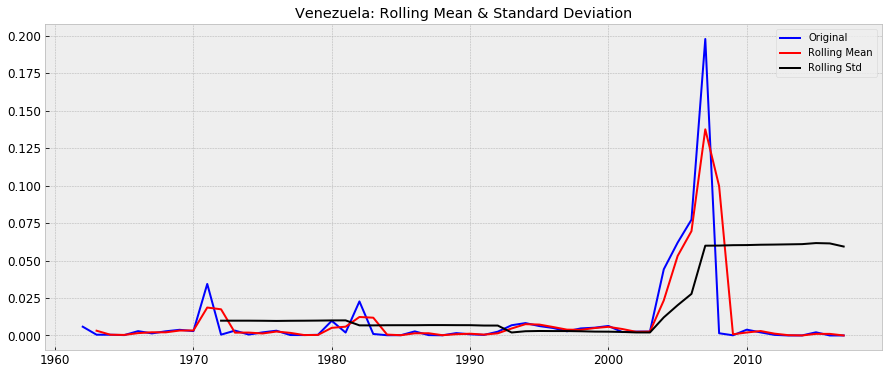

In [26]:
columns = df_grps.columns
y = df_grps.columns[1:]
cycles = int((len(df_grps))/5)

for col in y:
    pyplot.figure(figsize=(15,6))

    rolmean = df_grps[col].rolling(2).mean()
    rolstd = df_grps[col].rolling(cycles).std()
    location = os.getcwd()
    target = 'images\\engine_parts\\rca_tests\\rolling_stats\\'
    path = os.path.join(location, target)
    
    #Plot rolling statistics:
    orig = plt.plot(df_grps[col], color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('{}: Rolling Mean & Standard Deviation'.format(df_grps[col].name))
    savefile = os.path.join(path, df_grps[col].name)
    plt.savefig(str('{}_Rolling_Stats'.format(savefile)))
    plt.show(block=False)

### Augmented Dickey-Fuller  (ADF) Test
- The intuition behind the test is that if the series is integrated then the lagged level of the series y(t-1)  will provide no relevant information in predicting the change in y(t).
- Null hypothesis: The time series is not stationary
- Rejecting the null hypothesis (i.e. a very low p-value) will indicate staionarity

In [27]:
from statsmodels.tsa.stattools import adfuller

In [54]:
y = df_grps.columns
y

Index(['Argentina', 'Australia', 'Austria', 'Belgium', 'Brazil', 'Bulgaria', 'Canada', 'Chile', 'China', 'Cyprus', 'Denmark', 'Finland', 'France', 'Germany', 'Greece', 'Hong Kong', 'Hungary', 'India', 'Indonesia', 'Ireland', 'Israel', 'Italy', 'Japan', 'Kenya', 'Malta', 'Mexico', 'Morocco', 'Netherlands', 'New Zealand', 'Nigeria', 'Norway', 'Oman', 'Panama', 'Poland', 'Portugal', 'Romania', 'Saudi Arabia', 'Singapore', 'South Africa', 'South Korea', 'Spain', 'Sweden', 'Switzerland', 'Taiwan', 'Thailand', 'Trinidad and Tobago', 'Tunisia', 'Turkey', 'United Kingdom', 'United States of America', 'Venezuela'], dtype='object', name='exporter')

In [67]:
y = df_grps.columns

df = []
for col in y:
#Perform Dickey-Fuller test:
    dftest = adfuller(df_grps[col], autolag='AIC')
    df = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    df.append
    for key,value in dftest[4].items():
        df['Critical Value (%s)'%key] = value
        
df

Test Statistic                 -4.855853
p-value                         0.000042
#Lags Used                      0.000000
Number of Observations Used    55.000000
Critical Value (1%)            -3.555273
Critical Value (5%)            -2.915731
Critical Value (10%)           -2.595670
dtype: float64

In [101]:
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(12).mean()
    rolstd = timeseries.rolling(12).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

## Making Time Series Stationary
There are 2 major reasons behind non-stationaruty of a TS:

1. __Trend__ – varying mean over time. For eg, in this case we saw that on average, the number of passengers was growing over time.
2. __Seasonality__ – variations at specific time-frames. eg people might have a tendency to buy cars in a particular month because of pay increment or festivals.

### Transformations
- We can apply transformation which penalize higher values more than smaller values. These can be taking a log, square root, cube root, etc. Lets take a log transform here for simplicity:

#### Log Scale Transformation

### Techniques to remove Trend - Smoothing
- Smoothing is taking rolling averages over windows of time

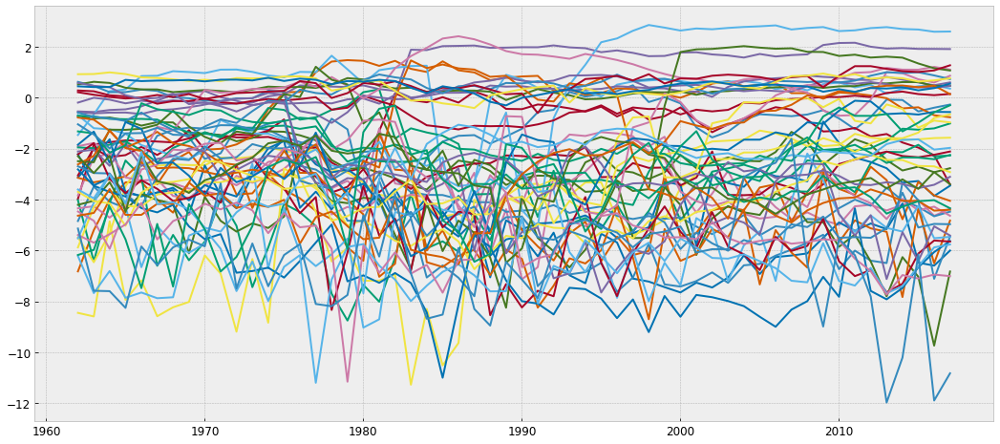

In [102]:
ts_log = np.log(df_grps)
plt.plot(ts_log)
plt.show()

In [103]:
ts_log

exporter,Argentina,Australia,Austria,Belgium,Brazil,Bulgaria,Canada,Chile,China,Cyprus,Denmark,Finland,France,Germany,Greece,Hong Kong,Hungary,India,Indonesia,Ireland,Israel,Italy,Japan,Kenya,Malta,Mexico,Morocco,Netherlands,New Zealand,Nigeria,Norway,Oman,Panama,Poland,Portugal,Romania,Saudi Arabia,Singapore,South Africa,South Korea,Spain,Sweden,Switzerland,Taiwan,Thailand,Trinidad and Tobago,Tunisia,Turkey,United Kingdom,United States of America,Venezuela
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1962-01-01,-4.845175,-3.974493,-0.543873,-0.746920,-6.820769,-3.840824,-1.468873,-4.027958,-5.492298,-3.136863,0.614590,-3.054938,-0.197571,0.515216,-3.145379,-1.910461,-0.687451,-1.955386,-8.449003,-2.222587,-2.698733,0.278564,-0.563427,-4.210275,-0.783749,-4.347198,-5.523503,-0.710083,-5.879847,-2.818520,-0.589388,-2.230703,-2.115505,-2.496176,-2.623603,-4.472013,-6.218685,-1.327135,-3.697071,-1.851339,-1.048939,0.210693,0.575035,-2.301976,-4.634632,-5.391937,-3.607287,-6.177269,0.916936,0.442388,-5.139345
1963-01-01,-3.494164,-1.842728,-0.566129,-0.821966,-5.201677,-2.339249,-0.663057,-6.427277,-6.462361,-2.403565,0.458063,-1.991919,-0.008032,0.618665,-3.325537,-1.782096,-1.201934,-1.986825,-8.589018,-3.442717,-2.960369,0.247336,-0.619796,-4.048757,-0.866972,-4.264127,-4.126948,-0.741911,-4.296087,-3.462008,-0.757326,-1.787301,-2.045823,-2.537676,-2.285182,-4.833222,-7.672856,-1.405656,-4.062176,-1.336516,-1.446580,0.111050,0.461363,-2.961413,-4.526960,-5.693985,-3.953904,-5.976628,0.924082,0.413344,-7.581565
1964-01-01,-4.086968,-1.751396,-0.488150,-0.780299,-4.002024,-2.210598,0.248807,-4.140851,-5.324519,-1.636078,0.213288,-2.336259,-0.080807,0.573838,-3.217680,-2.134161,-1.244987,-1.847625,-4.858321,-3.156858,-2.977910,0.089552,-0.589825,-3.321265,-1.302328,-4.711262,-3.042340,-0.834555,-3.635328,-3.702631,-0.813183,-3.191545,-2.678885,-1.258411,-1.292165,-5.936085,-6.807115,-2.163767,-4.150794,-2.558723,-1.994537,0.024560,0.409513,-2.281201,-3.590728,-5.360188,-3.018047,-4.282028,0.988983,0.414173,-7.596937
1965-01-01,-4.339657,-1.680826,-0.461554,-0.900661,-3.327492,-1.740686,0.320669,-2.470058,-3.479780,-3.726627,0.214967,-2.257968,-0.226575,0.386305,-3.098257,-3.132425,-1.416478,-1.718976,-7.939248,-3.689528,-3.799033,0.047611,-0.587064,-4.419900,-1.961366,-4.204108,-4.266935,-0.850213,-4.257769,-3.881346,-0.916942,-3.748470,-1.821007,-1.266360,-1.982345,-4.331738,-7.856846,-1.874659,-5.028738,-0.957415,-1.404507,-0.035651,0.091529,-4.490272,-4.603919,-4.977942,-4.159468,-5.563028,0.923413,0.695188,-8.252799
1966-01-01,-2.544554,-1.691113,-0.343544,-1.100831,-3.307949,-2.400937,0.843551,-3.098047,-2.562639,-3.869745,0.313723,-1.935703,-0.123916,0.321292,-2.532443,-3.256908,-1.865501,-2.074901,-7.173858,-3.868564,-4.265521,-0.035435,-0.644690,-3.779602,-1.703953,-2.357059,-6.655492,-0.836711,-4.279352,-4.338668,-0.588537,-3.245059,-2.683266,-1.222367,-2.093416,-2.822276,-7.650072,-0.223345,-3.733601,-1.231659,-1.393474,0.003451,-0.048329,-2.269634,-4.602255,-4.132213,-2.131101,-7.477909,0.793489,0.646658,-5.843343
1967-01-01,-1.499702,-1.725719,-0.115275,-0.965553,-4.007944,-3.371625,0.855235,-6.601068,-2.676261,-3.731608,0.261925,-2.252096,-0.173589,0.319123,-3.399107,-3.214606,-2.065566,-2.559275,-8.581711,-3.725370,-3.082616,-0.241401,-0.493914,-4.019313,-1.345810,-1.144289,-5.048965,-0.865956,-3.802382,-4.504899,-0.963959,-3.581217,-2.409071,-1.066698,-2.773069,-2.633785,-7.873163,-0.456067,-3.355182,-2.571317,-1.184470,0.100665,-0.013448,-3.281630,-4.170275,-5.566818,-4.184684,-4.958606,0.768717,0.666213,-6.575868
1968-01-01,-1.272845,-1.758667,0.110751,-0.976521,-4.514140,-3.362611,1.034709,-5.390016,-2.625149,-3.633437,0.011327,-1.872375,-0.104049,0.213277,-2.481165,-3.859497,-2.283134,-1.977719,-8.230203,-3.538694,-2.399104,-0.140969,-0.459688,-4.164821,-1.788157,-1.288013,-5.731376,-1.152701,-3.729062,-4.209368,-1.273300,-4.057863,-2.294338,-0.515091,-2.743499,-2.040917,-7.836475,-0.560819,-3.308560,

#### Moving Average
- We take average of ‘k’ consecutive values depending on the frequency of time series. 
- Here we can take the average over the past 1 year, i.e. last 12 values. 
- A drawback in this particular approach is that the time-period has to be strictly defined. 

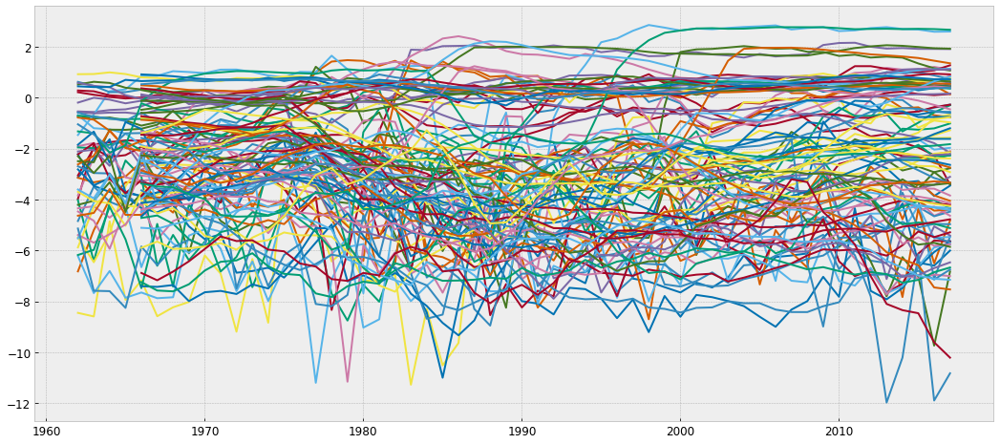

In [104]:
moving_avg = ts_log.rolling(5).mean()
plt.plot(ts_log)
plt.plot(moving_avg)
plt.show()

In [108]:
ma = []
for col in ts_log:
    ts_log_moving_avg_diff = ts_log[col] - moving_avg[col]
    #ma.append(ts_log_moving_avg_diff)
ts_log_moving_avg_diff.head(10)

year
1962-01-01         NaN
1963-01-01         NaN
1964-01-01         NaN
1965-01-01         NaN
1966-01-01    1.039455
1967-01-01    0.594234
1968-01-01    0.950215
1969-01-01    0.850733
1970-01-01    0.104072
1971-01-01    2.077604
Name: Venezuela, dtype: float64

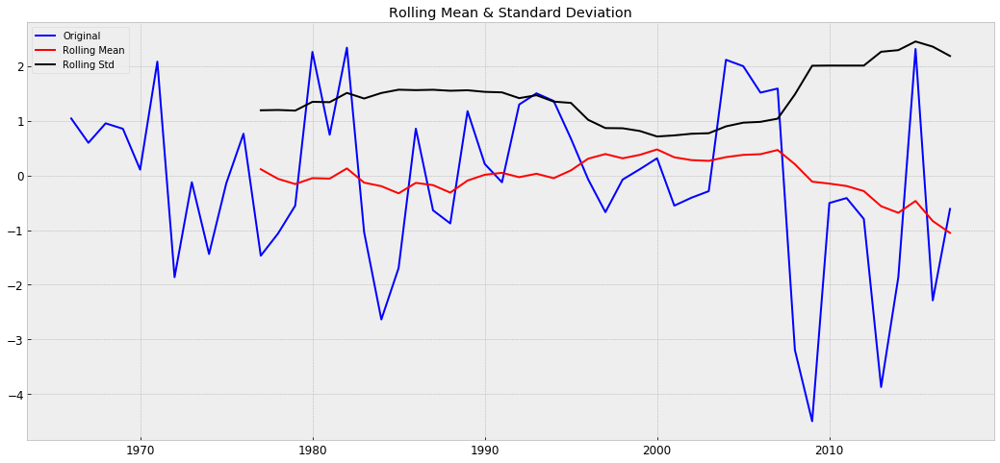

Results of Dickey-Fuller Test:
Test Statistic                 -5.373667
p-value                         0.000004
#Lags Used                      0.000000
Number of Observations Used    51.000000
Critical Value (1%)            -3.565624
Critical Value (5%)            -2.920142
Critical Value (10%)           -2.598015
dtype: float64


In [109]:
ts_log_moving_avg_diff.dropna(inplace=True)
test_stationarity(ts_log_moving_avg_diff)

#### Exponentially weighted moving average:
- To overcome the problem of choosing a defined window in moving average, we can use exponential weighted moving average
- We take a ‘weighted moving average’ where more recent values are given a higher weight. 
- There can be many technique for assigning weights. A popular one is exponentially weighted moving average where weights are assigned to all the previous values with a decay factor. 

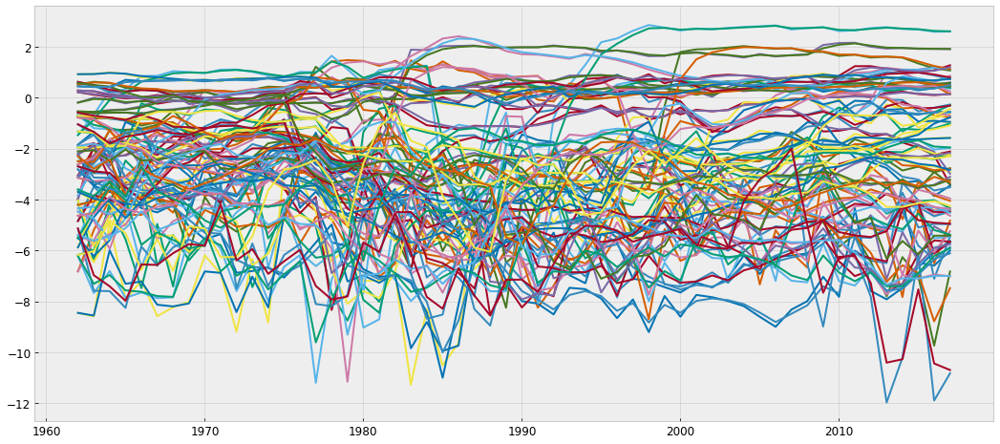

In [112]:
expwighted_avg = ts_log.ewm(com=0.5).mean()
#df.ewm(com=0.5).mean()
plt.plot(ts_log)
plt.plot(expwighted_avg)
plt.show()

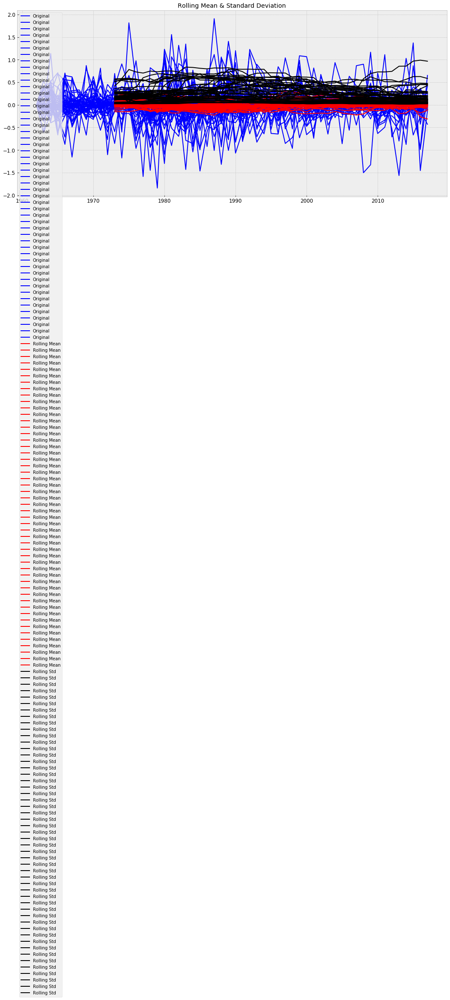

Results of Dickey-Fuller Test:


ValueError: too many values to unpack (expected 2)

In [121]:
ts_log_ewma_diff = ts_log- expwighted_avg
test_stationarity(ts_log_ewma_diff)

### Further Techniques to remove Seasonality and Trend
- The simple trend reduction techniques discussed before don’t work in all cases, particularly the ones with high seasonality. 

#### Differencing
- In this technique, we take the difference of the observation at a particular instant with that at the previous instant. 
- First order differencing in Pandas

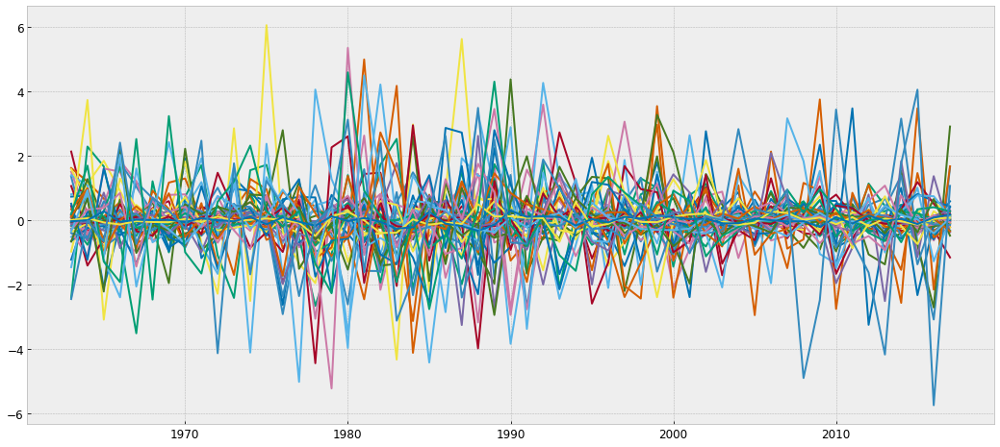

In [124]:
ts_log_diff = ts_log - ts_log.shift()
plt.plot(ts_log_diff)
plt.show()

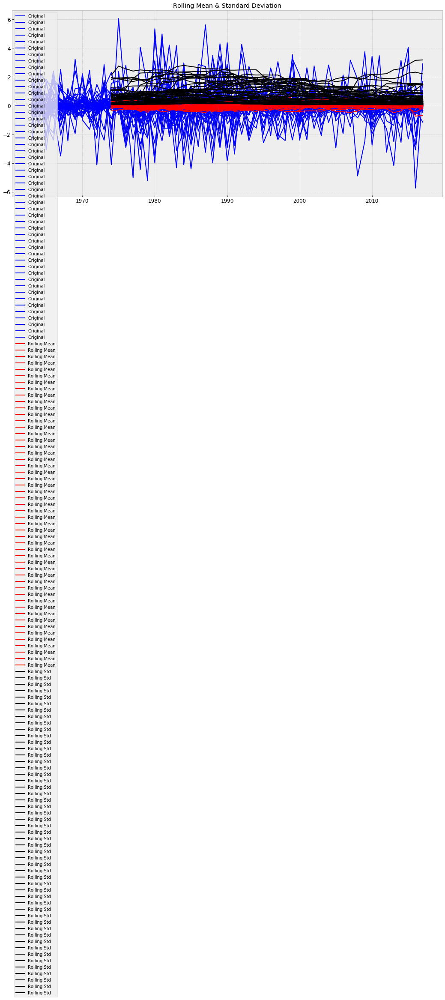

Results of Dickey-Fuller Test:


ValueError: too many values to unpack (expected 2)

In [125]:
ts_log_diff.dropna(inplace=True)
test_stationarity(ts_log_diff)

#### Decomposition
- In this approach, both trend and seasonality are modeled separately and the remaining part of the series is returned.

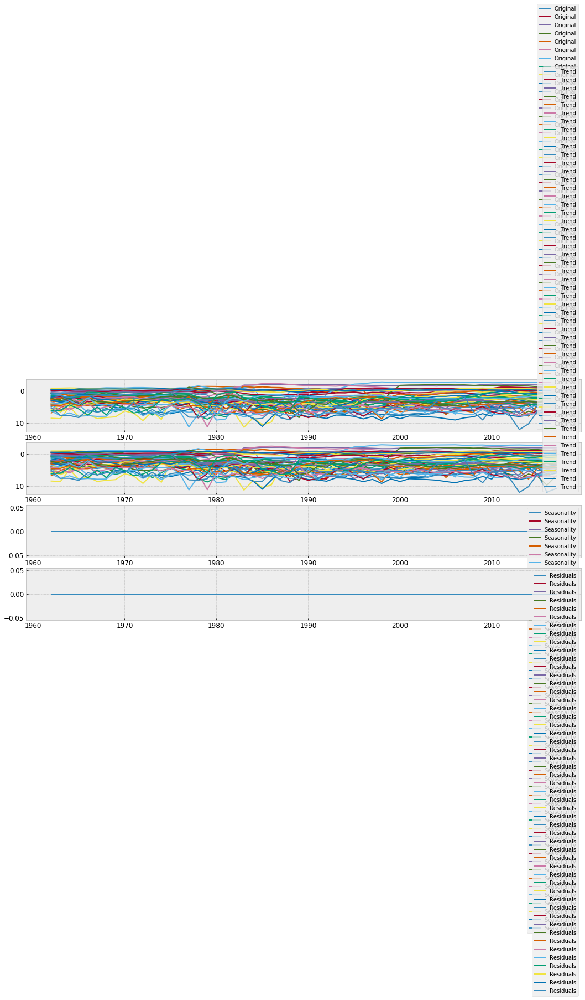

In [126]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(ts_log)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.subplot(411)
plt.plot(ts_log, label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')
plt.tight_layout()

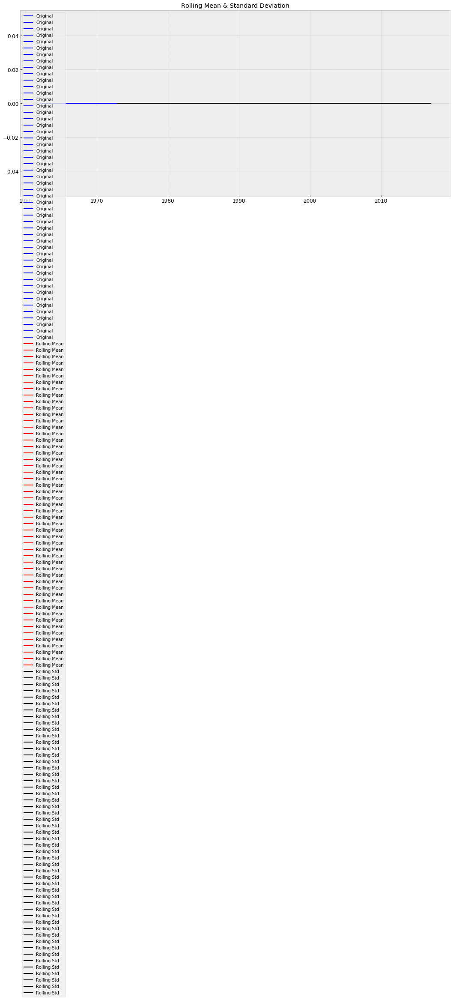

Results of Dickey-Fuller Test:


ValueError: too many values to unpack (expected 2)

In [131]:
ts_log_decompose = residual
ts_log_decompose.dropna(inplace=True)
test_stationarity(ts_log_decompose)

## Interpreting ACF plots


ACF Shape	| Indicated Model |
-- | -- |
Exponential, decaying to zero |	Autoregressive model. Use the partial autocorrelation plot to identify the order of the autoregressive model |
Alternating positive and negative, decaying to zero	Autoregressive model. |  Use the partial autocorrelation plot to help identify the order. |
One or more spikes, rest are essentially zero | Moving average model, order identified by where plot becomes zero. |
Decay, starting after a few lags |	Mixed autoregressive and moving average (ARMA) model. | 
All zero or close to zero | Data are essentially random. |
High values at fixed intervals | Include seasonal autoregressive term. |
No decay to zero |	Series is not stationary |